In [1]:
# Load Estimator Functions

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import importlib

import loader
importlib.reload(loader)
from loader import load_estimator_functions
from parallel_runner import run_functions_parallel

try:
    functions = load_estimator_functions(Path('..') / 'week 2')
except:
    print("No student estimators found. You are in result-only mode.")
    functions = {}

In [2]:
i = 1
for key in functions.keys():
    print(f"{i}: {key}")
    i += 1

1: estimator.py
2: estimator_em.py
3: estimator_smooth.py


# Real Tests

In [3]:
import sys
from importlib.machinery import SourcelessFileLoader
from importlib.util import module_from_spec, spec_from_loader
from pathlib import Path

module_dir = Path.cwd()
pyc_candidates = [
    module_dir / '__pycache__' / f'SimulationIllustrationFuncs.cpython-{sys.version_info.major}{sys.version_info.minor}.pyc',
    module_dir / '__pycache__' / 'SimulationIllustrationFuncs.cpython-312.pyc',
    module_dir / '__pycache__' / 'SimulationIllustrationFuncs.cpython-311.pyc',
]
pyc_path = next((path for path in pyc_candidates if path.exists()), None)
if pyc_path is None:
    raise FileNotFoundError('Could not find SimulationIllustrationFuncs in week2_testing/__pycache__')

loader = SourcelessFileLoader('SimulationIllustrationFuncs', str(pyc_path))
spec = spec_from_loader('SimulationIllustrationFuncs', loader)
SimulationIllustrationFuncs = module_from_spec(spec)
loader.exec_module(SimulationIllustrationFuncs)

simulate = SimulationIllustrationFuncs.simulate
simulate_from_latents = SimulationIllustrationFuncs.simulate_from_latents
fit_transform_latents = SimulationIllustrationFuncs.fit_transform_latents
plot_input_latent_observation = SimulationIllustrationFuncs.plot_input_latent_observation
plot_input_latent_comparison_interactive = SimulationIllustrationFuncs.plot_input_latent_comparison_interactive

%matplotlib widget

(inputs: 'np.ndarray', states: 'np.ndarray', results: 'Mapping[str, Mapping[str, np.ndarray]]', align_inputs: 'bool' = False, align_latents: 'bool' = True, active: 'Mapping[str, object] | None' = None, *, figsize: 'tuple[float, float] | None' = None, dpi: 'int | None' = None, tmin: 'int | None' = None, tmax: 'int | None' = None)
(False, True, None)
{'figsize': None, 'dpi': None, 'tmin': None, 'tmax': None}
figsize (np.float64(10.0), np.float64(5.0))
axes 2
0 2 input
1 8 latent state


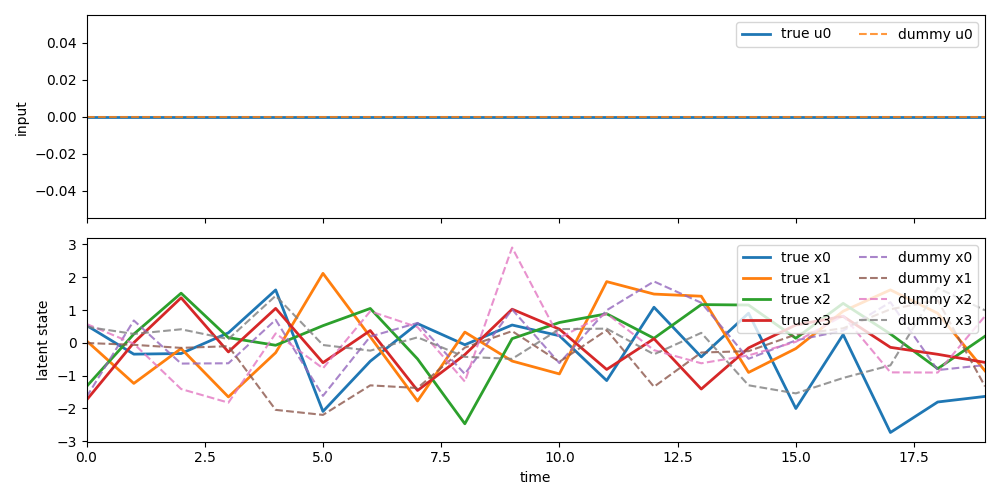

In [4]:
import inspect
print(inspect.signature(plot_input_latent_comparison_interactive))
print(plot_input_latent_comparison_interactive.__defaults__)
print(plot_input_latent_comparison_interactive.__kwdefaults__)

inputs = np.zeros((20, 1))
states = np.random.randn(20, 4)
results = {
    'dummy': {
        'inputs': np.zeros((20, 1)),
        'latent_states': np.random.randn(20, 4),
    }
}
fig, axes = plot_input_latent_comparison_interactive(inputs, states, results)
print('figsize', tuple(fig.get_size_inches()))
print('axes', len(np.atleast_1d(axes)))
for axis_index, axis in enumerate(np.atleast_1d(axes)):
    print(axis_index, len(axis.lines), axis.get_ylabel())

## Sparse Impulse Input

### Case 1

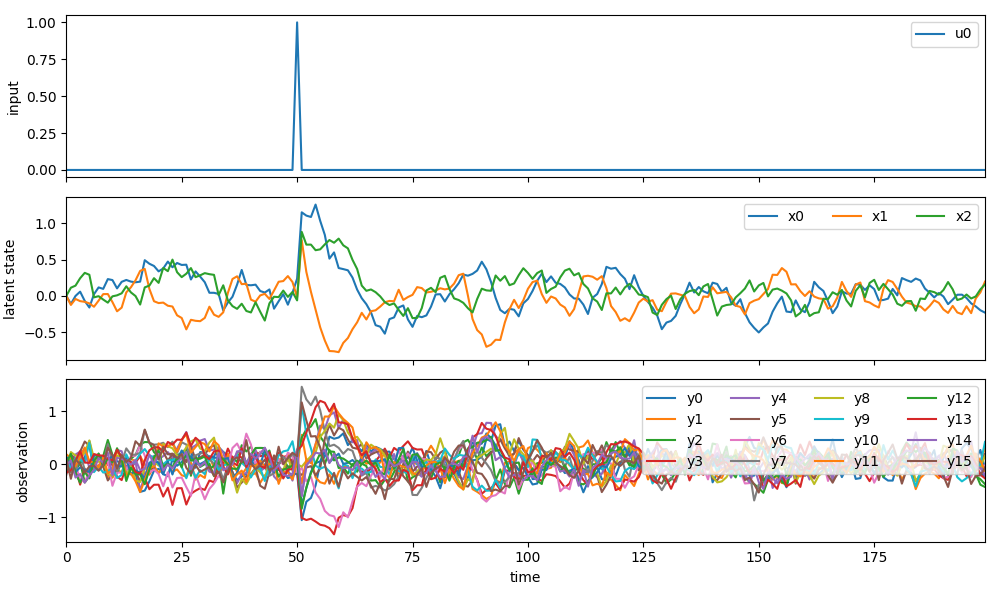

In [5]:
A = np.array([[0.9, 0.1, 0],
              [-0.2, 0.8, 0],
              [0.1, -0.1, 0.8]])

B = np.array([[1], 
              [0.6], 
              [0.8]])

C = np.random.normal(0, 1, (16, 3))
C /= np.linalg.norm(C, axis=1, keepdims=True)


inputs = np.zeros((200, 1))
inputs[50] = 1

x_noise = np.random.normal(0, 0.1, (200, 3))
y_noise = np.random.normal(0, 0.1, (200, 16))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

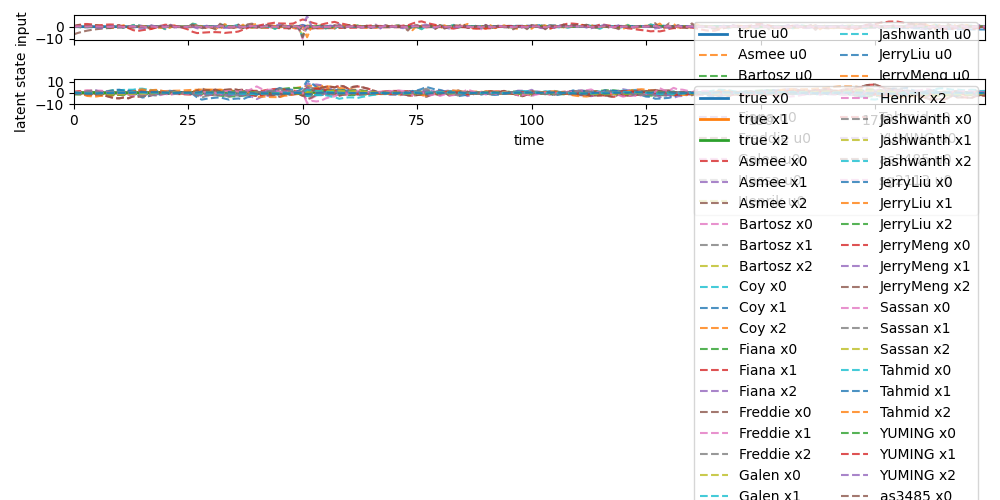

In [6]:
try:
    data = np.load("MethodResults/SparseImpulseInput_Case1.npz", allow_pickle=True)
    results = {}
    for k in data.files:
        v = data[k]
        try:
            if getattr(v, 'shape', None) == () and getattr(v, 'dtype', None) == object:
                results[k] = v.item()
            else:
                results[k] = v
        except Exception:
            results[k] = v
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case1.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()


### Case 2 - null-space injection

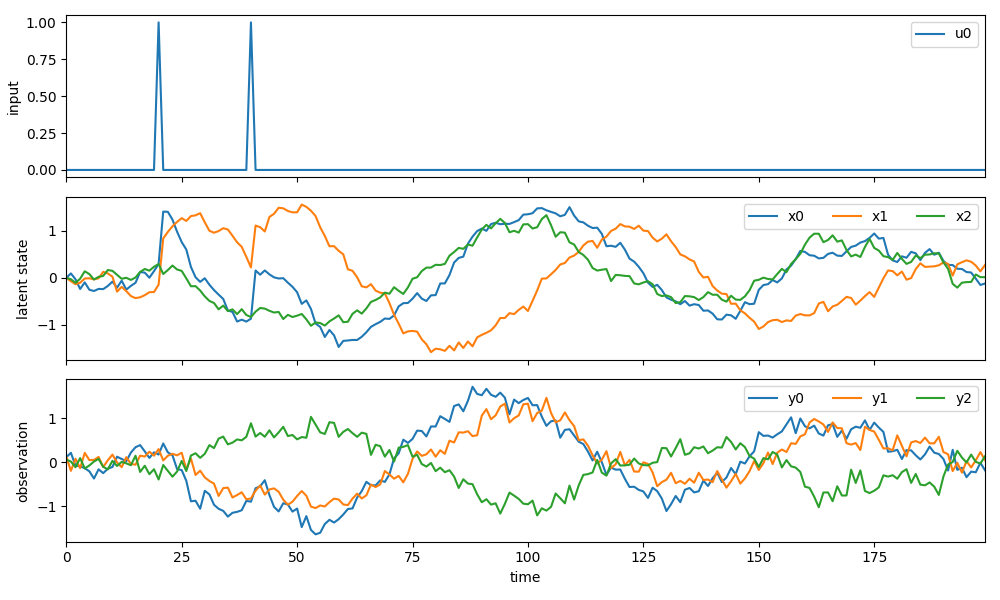

In [7]:
angle = 5 / 180 * np.pi
A = np.array([[np.cos(angle) * 0.98, -np.sin(angle) * 0.98, 0],
              [np.sin(angle) * 0.98, np.cos(angle) * 0.98, 0],
              [0.1, -0.1, 0.8]])

B = np.array([[1], 
              [1], 
              [0]])

C = np.array([[1, -1, 0], 
              [0, 0, 1], 
              [0.1, -0.098, -1]])
C /= np.linalg.norm(C, axis=1, keepdims=True)


inputs = np.zeros((200, 1))
inputs[20] = 1
inputs[40] = 1

x_noise = np.random.normal(0, 0.1, (200, 3))
y_noise = np.random.normal(0, 0.1, (200, 3))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

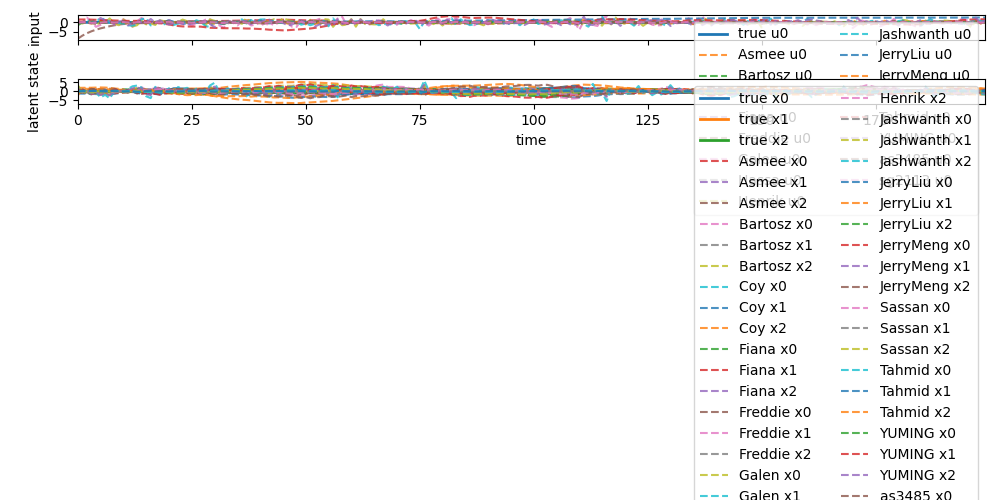

In [8]:
try:
    # Load saved results if present; allow_pickle to support object entries
    data = np.load("MethodResults/SparseImpulseInput_Case2.npz", allow_pickle=True)
    results = {}
    for k in data.files:
        v = data[k]
        try:
            # extract python objects saved as 0-d object arrays
            if getattr(v, 'shape', None) == () and getattr(v, 'dtype', None) == object:
                results[k] = v.item()
            else:
                results[k] = v
        except Exception:
            results[k] = v
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case2.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()


### Case 3 - null-space injection

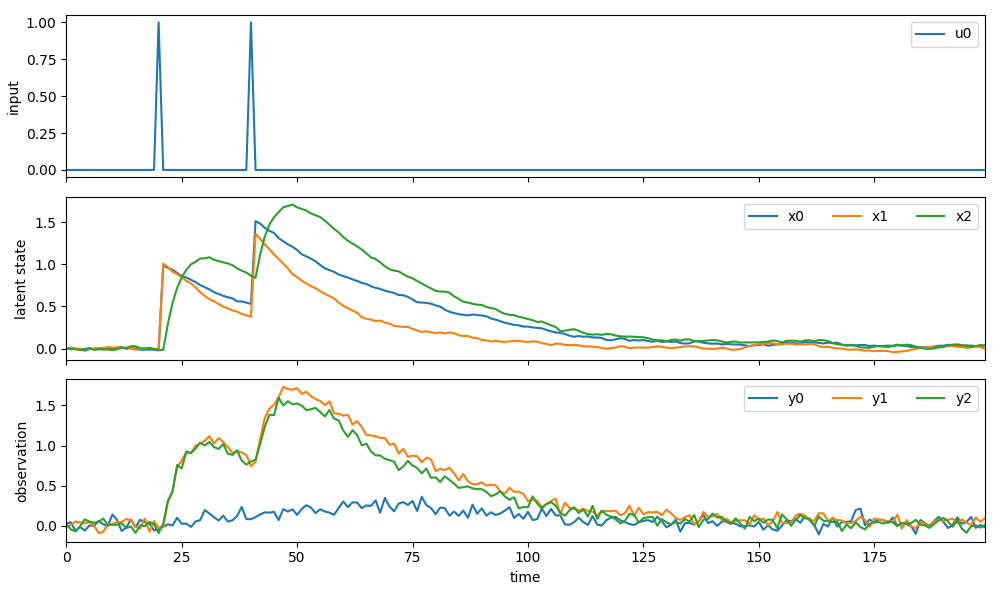

In [9]:
A = np.array([[0.97, 0, 0],
              [0, 0.95, 0],
              [0.2, 0.1, 0.8]])

B = np.array([[1], 
              [1], 
              [0]])

C = np.array([[1, -1, 0], 
              [0.1, -0.1, 0.5], 
              [-0.1, 0.09, 0.5]])
C /= np.linalg.norm(C, axis=1, keepdims=True)


inputs = np.zeros((200, 1))
inputs[20] = 1
inputs[40] = 1

x_noise = np.random.normal(0, 0.01, (200, 3))
y_noise = np.random.normal(0, 0.05, (200, 3))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

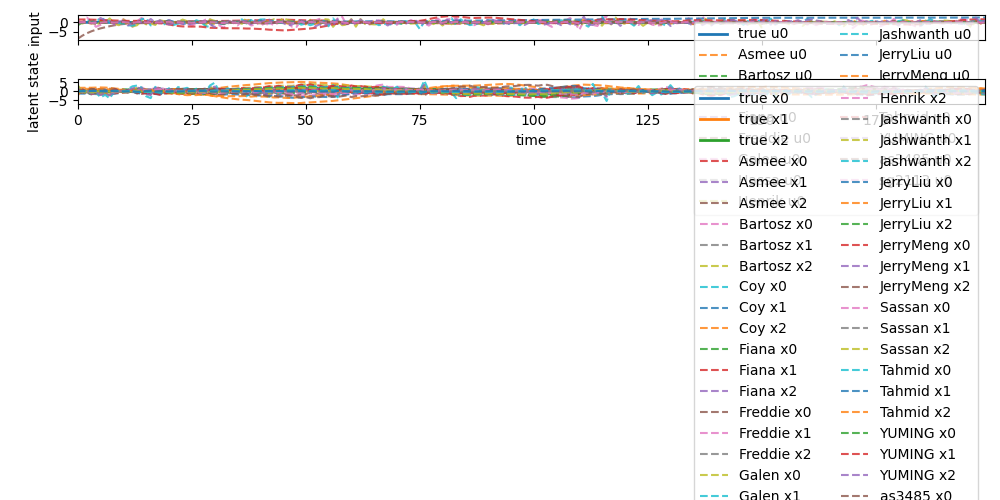

In [10]:
try:
    np.load("MethodResults/SparseImpulseInput_Case3.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case3.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 4 - ill-conditioned

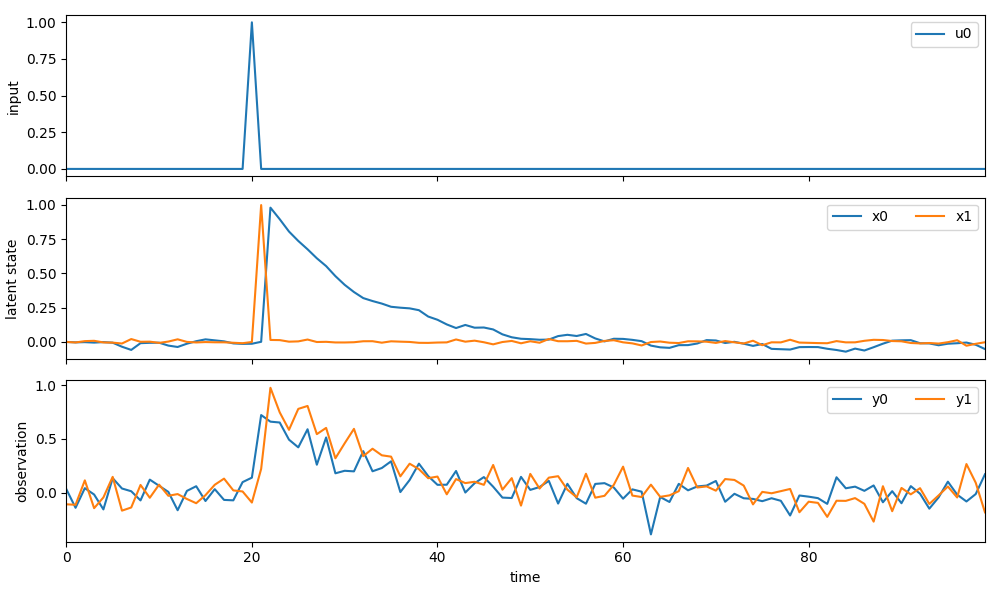

In [11]:
A = np.array([[0.9, 1],
              [0, 0.01]])

B = np.array([[0],
              [1]])

C = np.array([[1.0, 1.0],
              [1.0, 0.0]])
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[20] = 1

x_noise = np.random.normal(0, 0.01, (100, 2))
y_noise = np.random.normal(0, 0.1, (100, 2))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

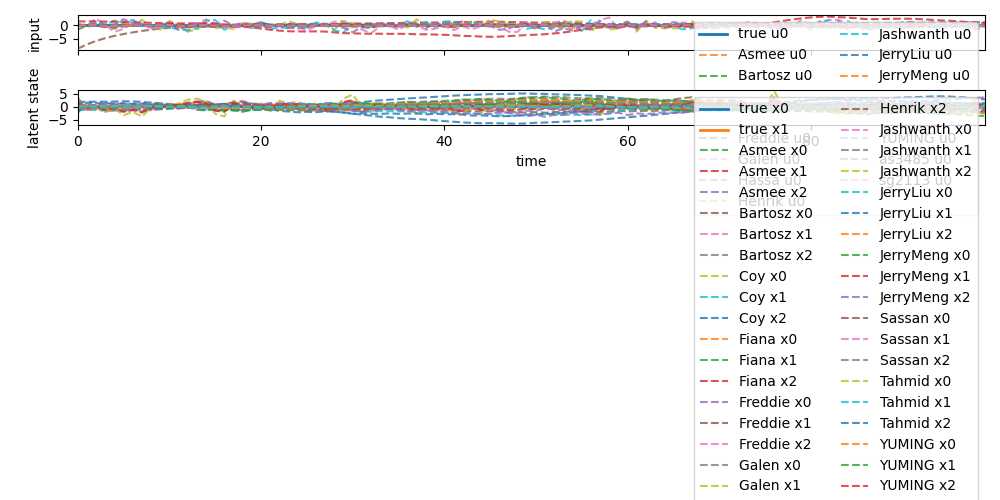

In [12]:
try:
    np.load("MethodResults/SparseImpulseInput_Case4.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=2,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case4.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 5 - ill-conditioned

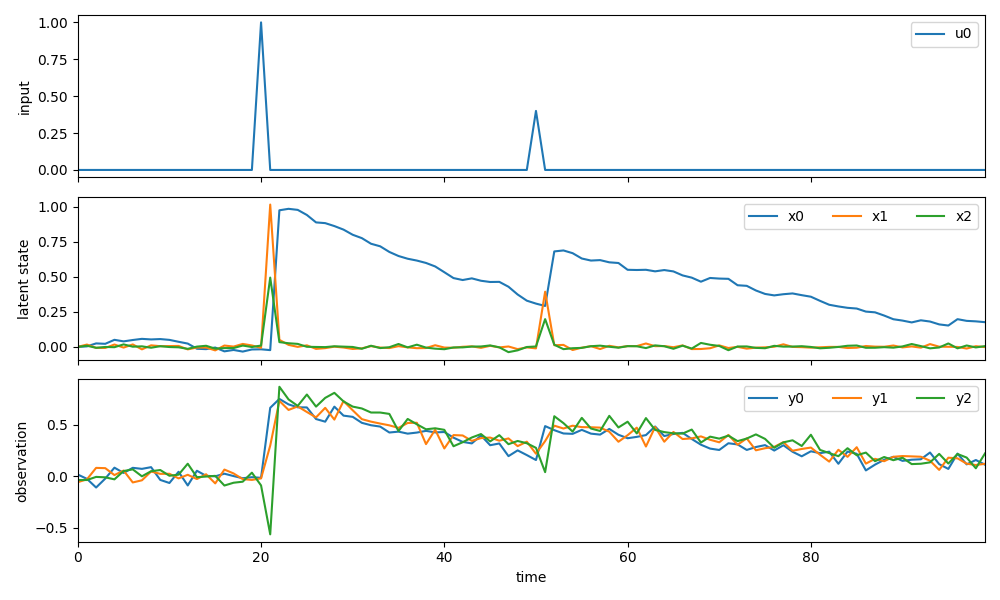

In [13]:
A = np.array([[0.97, 0.5, 1],
              [0, 0.05, 0],
              [0, 0, 0.1]])

B = np.array([[0,],
              [1,],
              [0.5,],])

C = np.array([[1.0, 1.0, 0],
              [1.0, 0, 1.0],
              [1.0, -0.5, -0.5],])
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[20] = 1
inputs[50] = 0.4

x_noise = np.random.normal(0, 0.01, (100, 3))
y_noise = np.random.normal(0, 0.05, (100, 3))
states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

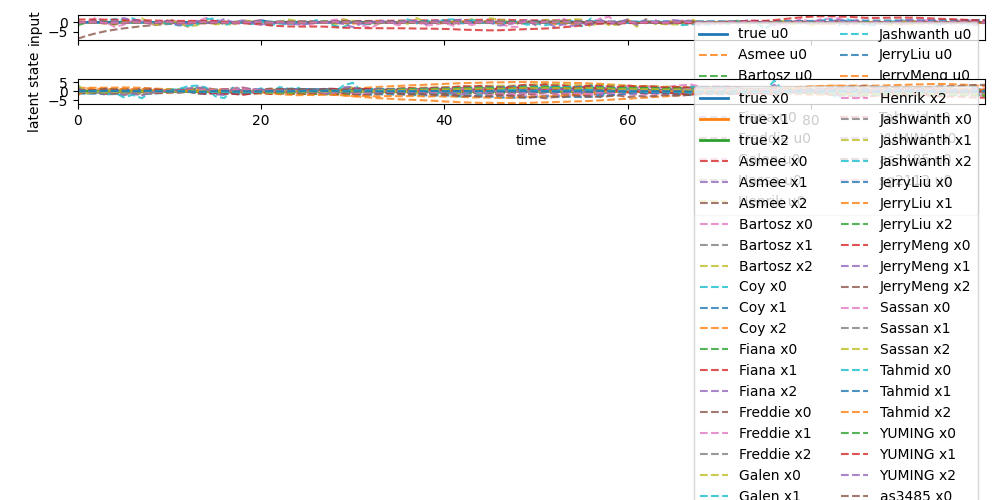

In [14]:
try:
    np.load("MethodResults/SparseImpulseInput_Case5.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case5.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 6 - transitional growth

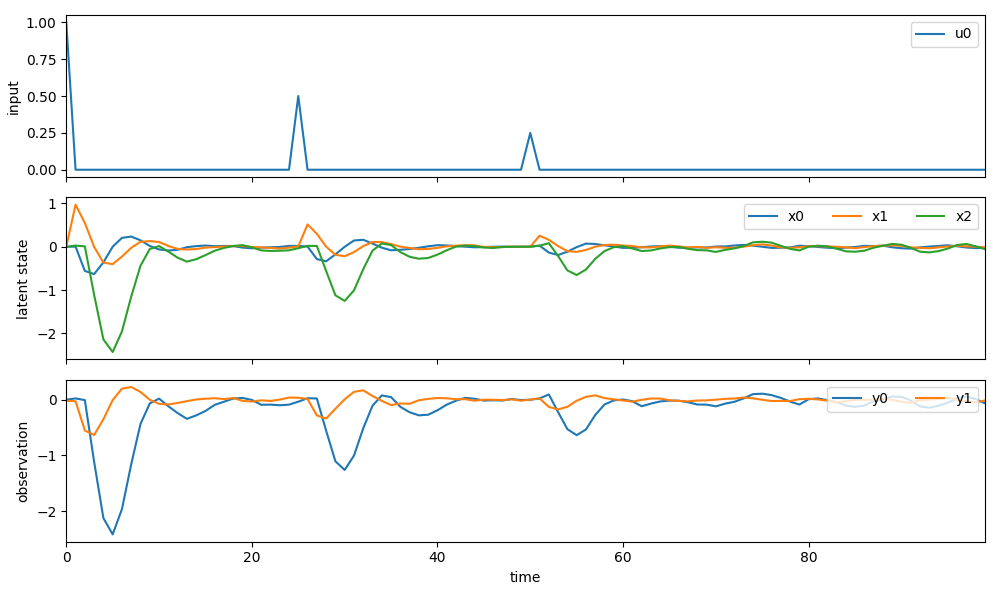

In [15]:
angle = 45 / 180 * np.pi
A = np.array([
    [0.8 * np.cos(angle), -0.8 * np.sin(angle), 0],
    [0.8 * np.sin(angle), 0.8 * np.cos(angle), 0],
    [2, 0, 0.8]
])

B = np.array([[0], [1.0], [0]])

C = np.array([
    [0.0, 0.0, 1.0],
    [1.0, 0.0, 0.0]
])

inputs = np.zeros((100, 1))
inputs[0] = 1
inputs[25] = 0.5
inputs[50] = 0.25

x_noise = np.random.normal(0, 0.01, (100, 3))
y_noise = np.random.normal(0, 0.01, (100, 2))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

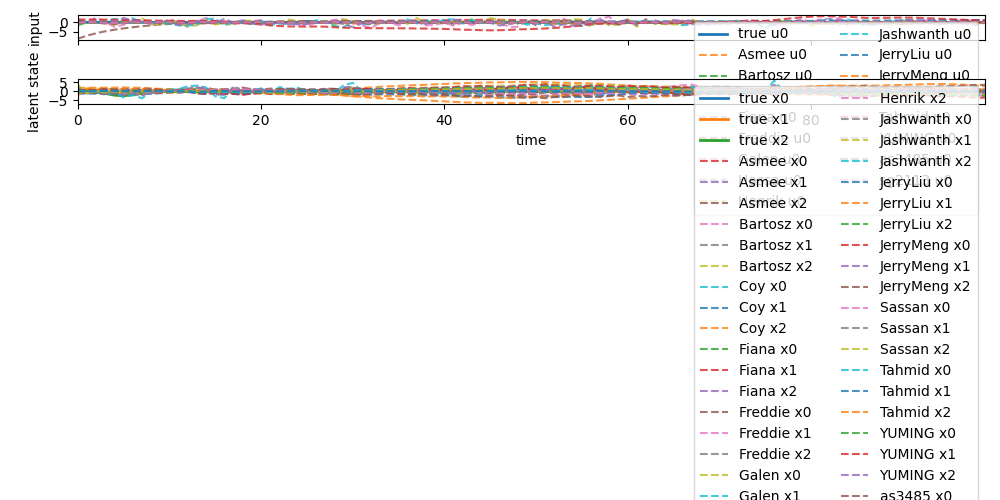

In [16]:
try:
    np.load("MethodResults/SparseImpulseInput_Case6.npz")
except FileNotFoundError:
    subfunc = {key: func for key, func in functions.items() if not key in ["as3485", "Bartosz", "Fiana", "JerryLiu"]}

    results = run_functions_parallel(
        subfunc,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case6.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 7 - hidden driven osc

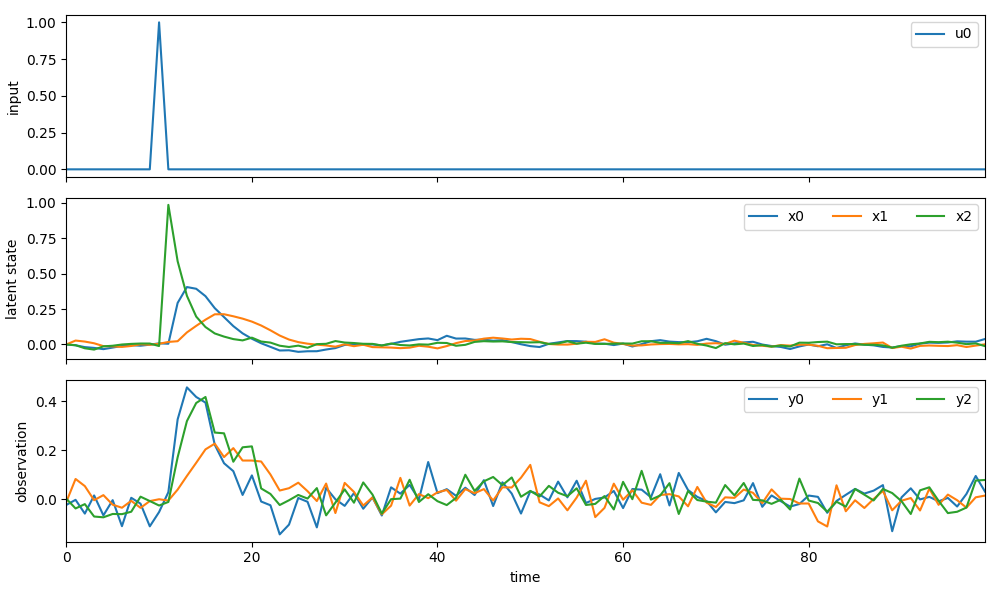

In [17]:
angle = 15 / 180 * np.pi
A = np.array([
    [0.8 * np.cos(angle), -0.8 * np.sin(angle), 0.3],
    [0.8 * np.sin(angle), 0.8 * np.cos(angle), 0],
    [0, 0, 0.6]
])

B = np.array([[0.0], [0.0], [1.0]])

C = np.array([[1.0, 0.0, 0.0],
              [0.0, 1.0, 0.0],
              [0.5, 0.5, 0.0],])
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[10] = 1

x_noise = np.random.normal(0, 0.01, (100, 3))
y_noise = np.random.normal(0, 0.04, (100, 3))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

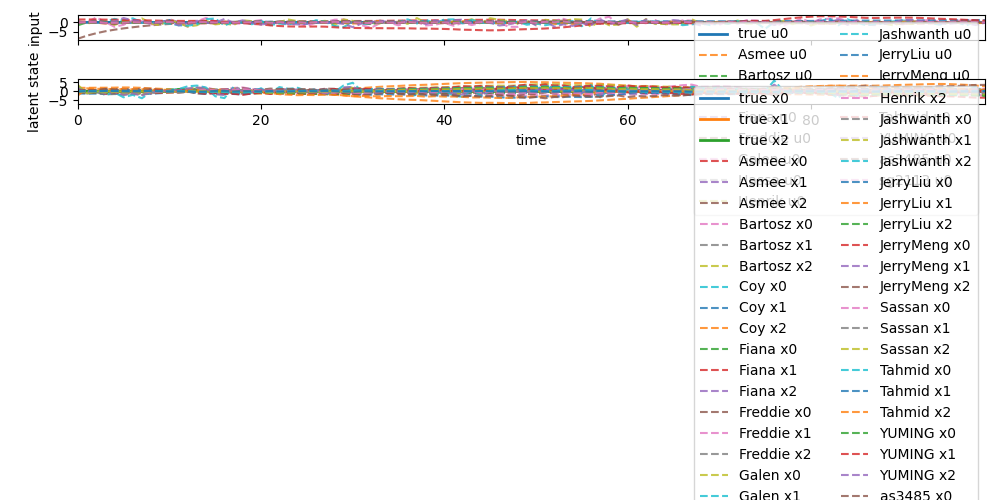

In [18]:
try:
    np.load("MethodResults/SparseImpulseInput_Case7.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case7.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 8 - High-low freq

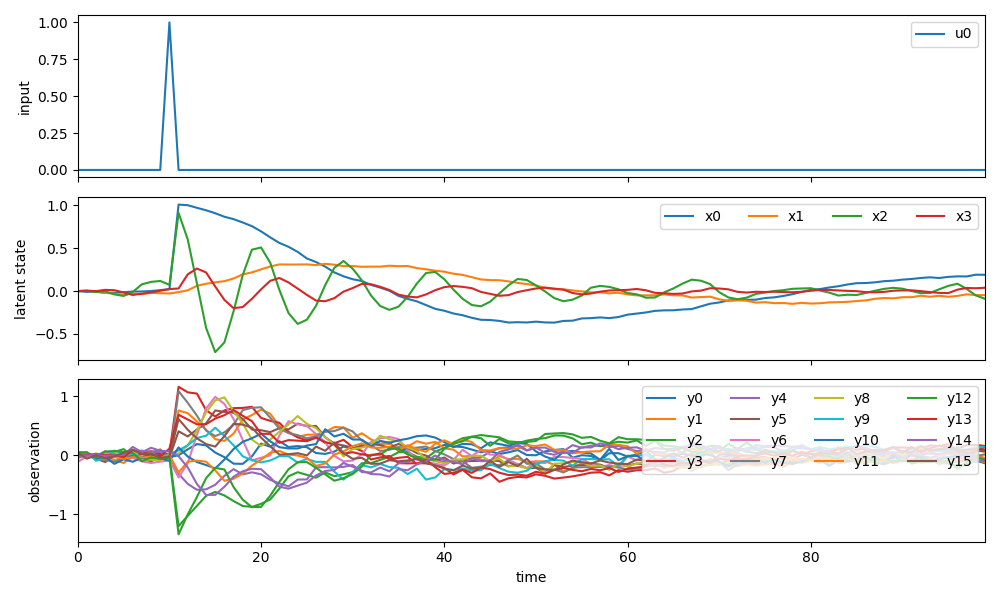

In [19]:
angle_slow = 4 / 180 * np.pi
angle_fast = 40 / 180 * np.pi
A = np.array([
    [0.98 * np.cos(angle_slow), -0.98 * np.sin(angle_slow) * 2, 0, 0],
    [0.98 * np.sin(angle_slow) / 2, 0.98 * np.cos(angle_slow), 0, 0],
    [0, 0, 0.95 * np.cos(angle_fast), -0.95 * np.sin(angle_fast) * 3],
    [0, 0, 0.95 * np.sin(angle_fast) / 3, 0.95 * np.cos(angle_fast)],
])

B = np.array([[1], 
              [0],
              [0.9],
              [0]])

C = np.random.normal(0, 1, (16, 4))
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[10] = 1

x_noise = np.random.normal(0, 0.01, (100, 4))
y_noise = np.random.normal(0, 0.04, (100, 16))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

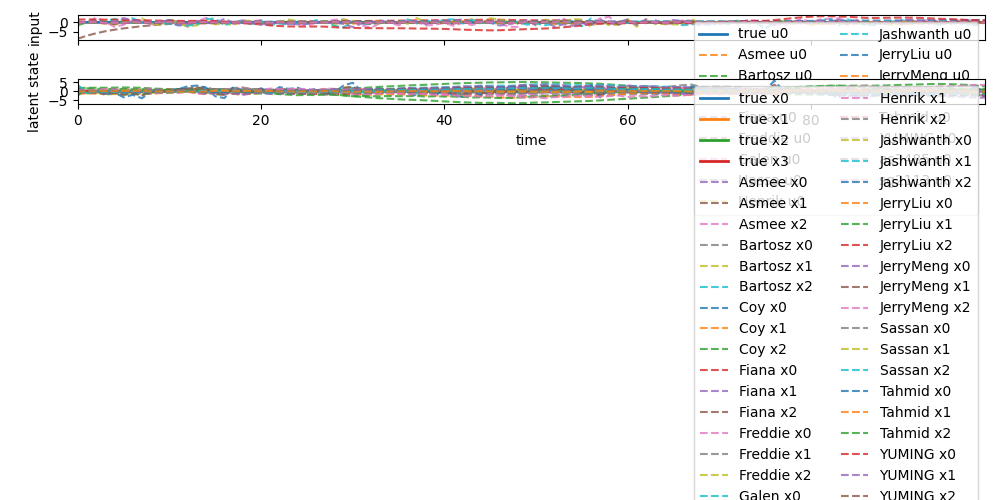

In [20]:
try:
    np.load("MethodResults/SparseImpulseInput_Case8.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=4,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case8.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 9 - Noisy

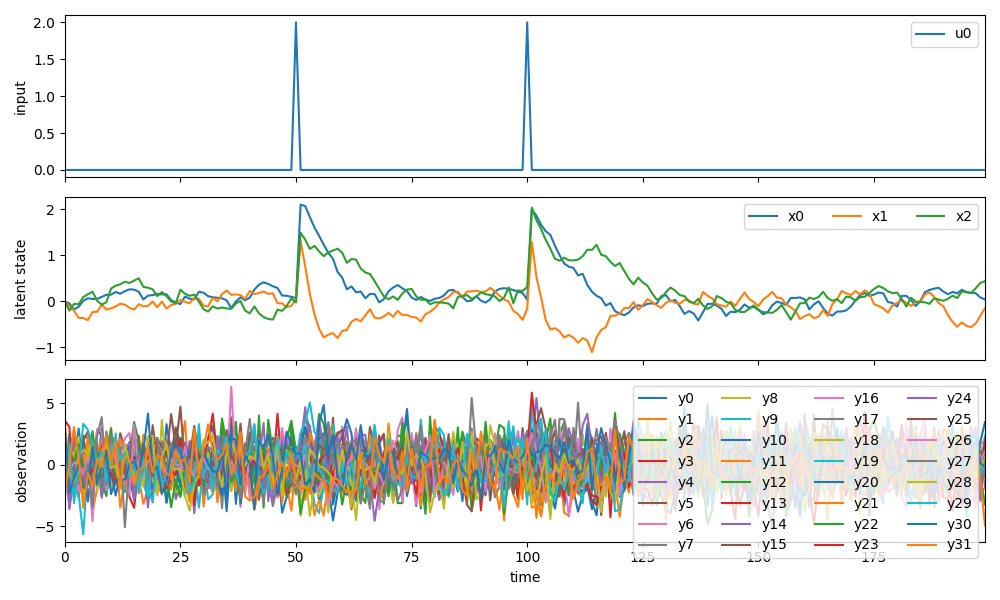

In [21]:
A = np.array([[0.9, 0.1, 0],
              [-0.2, 0.8, 0],
              [0.1, -0.1, 0.8]])

B = np.array([[1], 
              [0.6], 
              [0.8]])

C = np.random.normal(0, 1, (32, 3))
C /= np.linalg.norm(C, axis=1, keepdims=True)


inputs = np.zeros((200, 1))
inputs[50] = 2
inputs[100] = 2

x_noise = np.random.normal(0, 0.1, (200, 3))
y_noise = np.random.normal(0, 1.5, (200, 32))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

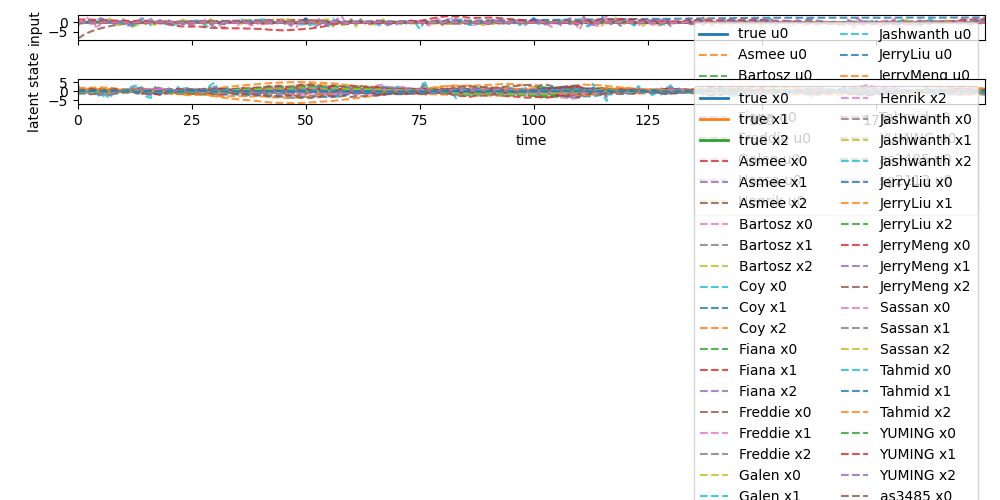

In [22]:
try:
    np.load("MethodResults/SparseImpulseInput_Case9.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case9.npz", **results)


plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 10 - Short Time

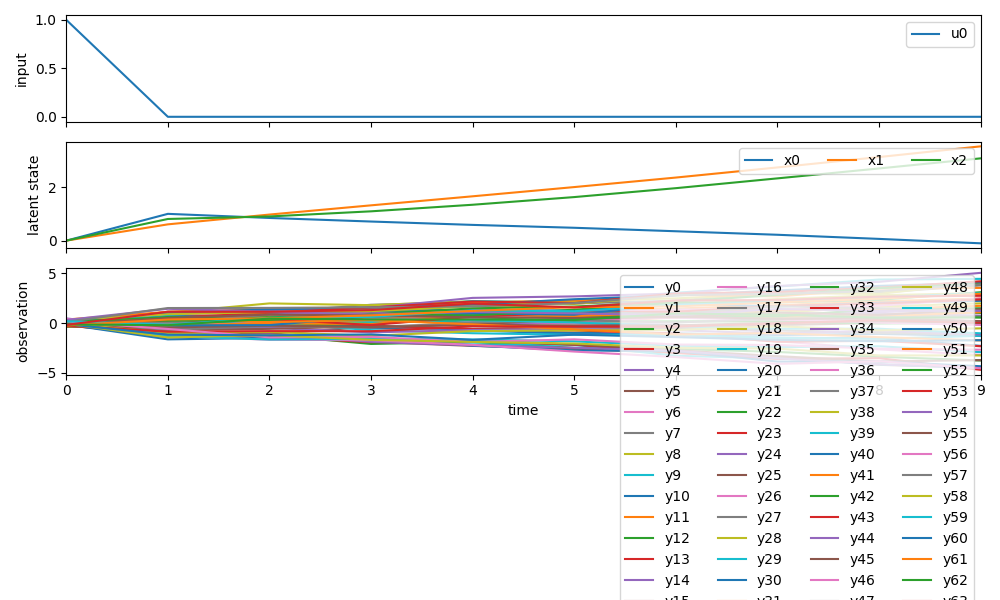

In [23]:
A = np.eye(3) * 0.7 + np.random.normal(0, 0.2, (3, 3))
B = np.array([[1], 
              [0.6], 
              [0.8]])
C = np.random.normal(0, 1, (64, 3))
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((10, 1))
inputs[0] = 1

x_noise = np.random.normal(0, 0.01, (10, 3))
y_noise = np.random.normal(0, 0.2, (10, 64))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

c:\Github\GG4\week2_testing\SimulationIllustrationFuncs.py:258: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


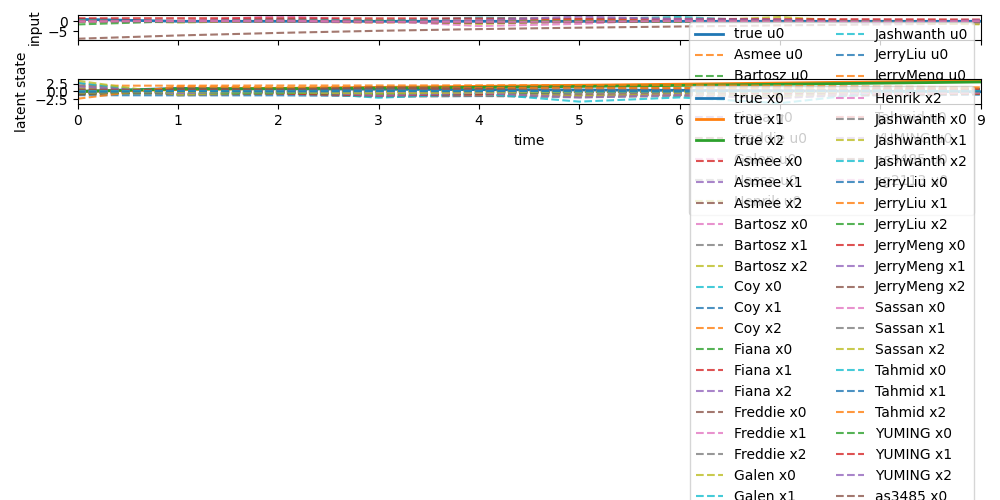

In [24]:
try:
    np.load("MethodResults/SparseImpulseInput_Case10.npz")
except FileNotFoundError:
    subfuncs = {key: func for key, func in functions.items() if not key in ["Tahmid", ]}

    results = run_functions_parallel(
        subfuncs,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case10.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 11 - Inadequate Latents

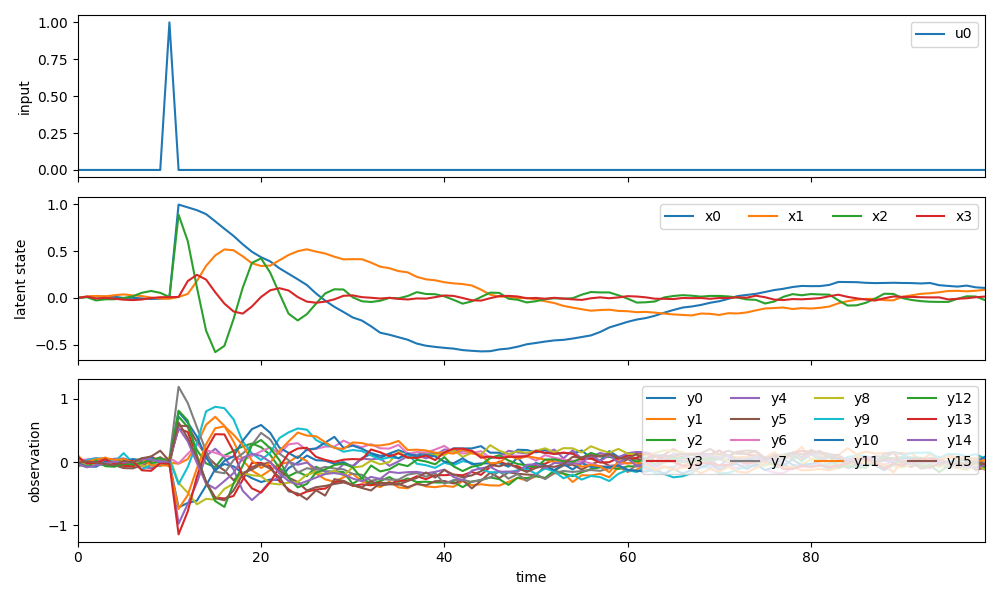

In [25]:
angle_slow = 4 / 180 * np.pi
angle_fast = 40 / 180 * np.pi
A = np.array([
    [0.98 * np.cos(angle_slow), -0.98 * np.sin(angle_slow) * 2, 0, 0],
    [0.98 * np.sin(angle_slow) / 2, 0.98 * np.cos(angle_slow), 0, 0.5],
    [0, 0, 0.9 * np.cos(angle_fast), -0.9 * np.sin(angle_fast) * 3],
    [0, 0, 0.9 * np.sin(angle_fast) / 3, 0.9 * np.cos(angle_fast)],
])

B = np.array([[1], 
              [0],
              [0.9],
              [0]])

C = np.random.normal(0, 1, (16, 4))
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[10] = 1

x_noise = np.random.normal(0, 0.01, (100, 4))
y_noise = np.random.normal(0, 0.04, (100, 16))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

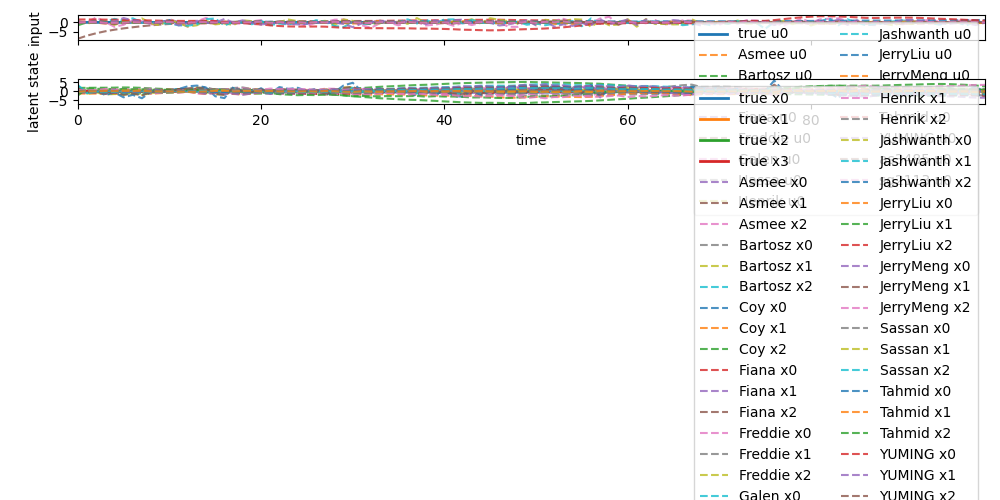

In [26]:
try:
    np.load("MethodResults/SparseImpulseInput_Case11.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=2,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case11.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 12 - overcomplex assumption

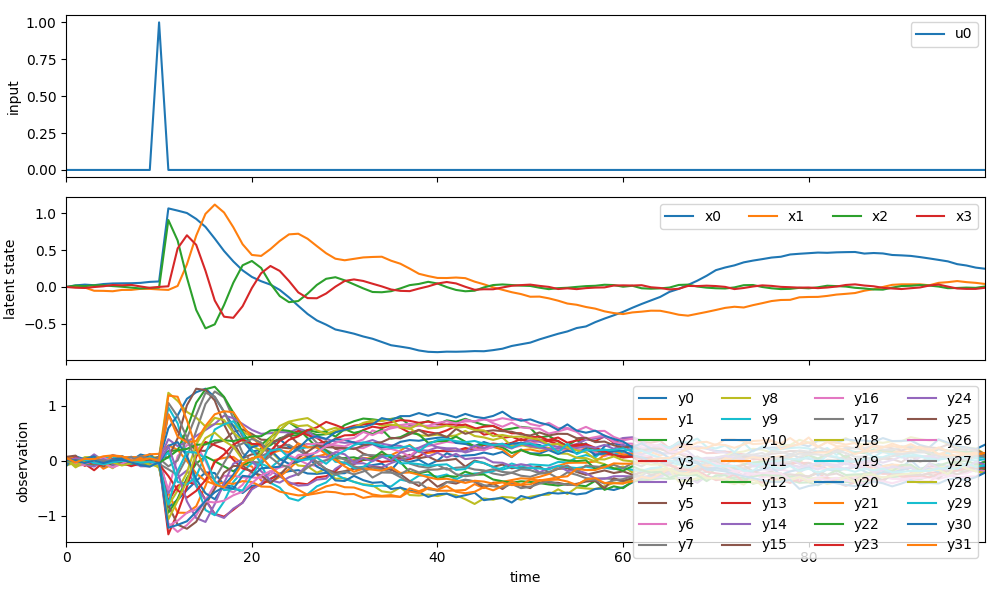

In [27]:
angle_slow = 4 / 180 * np.pi
angle_fast = 40 / 180 * np.pi
A = np.array([
    [0.98 * np.cos(angle_slow), -0.98 * np.sin(angle_slow) * 2, 0, 0],
    [0.98 * np.sin(angle_slow) / 2, 0.98 * np.cos(angle_slow), 0, 0.5],
    [0, 0, 0.9 * np.cos(angle_fast), -0.9 * np.sin(angle_fast)],
    [0, 0, 0.9 * np.sin(angle_fast), 0.9 * np.cos(angle_fast)],
])

B = np.array([[1], 
              [0],
              [0.9],
              [0]])

C = np.random.normal(0, 1, (32, 4))
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[10] = 1

x_noise = np.random.normal(0, 0.01, (100, 4))
y_noise = np.random.normal(0, 0.04, (100, 32))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

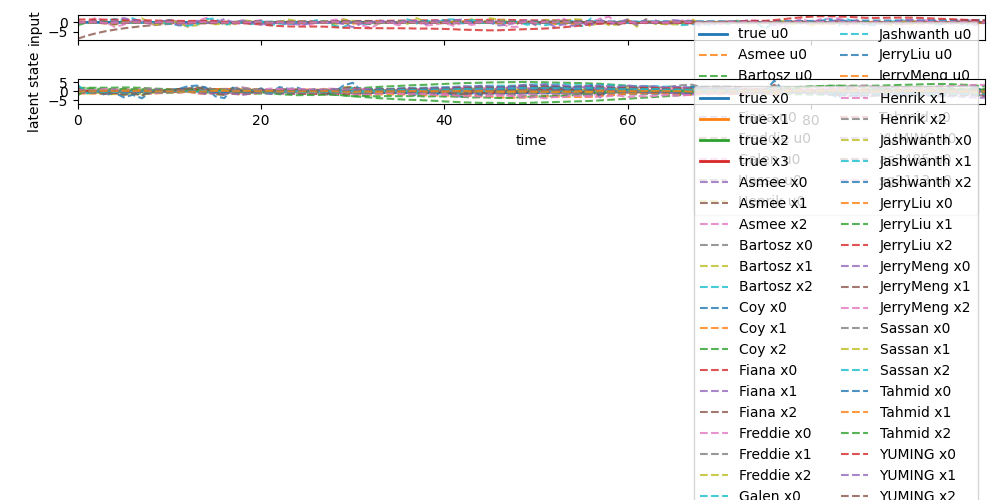

In [28]:
try:
    np.load("MethodResults/SparseImpulseInput_Case12.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=8,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case12.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 13 - Low output dim

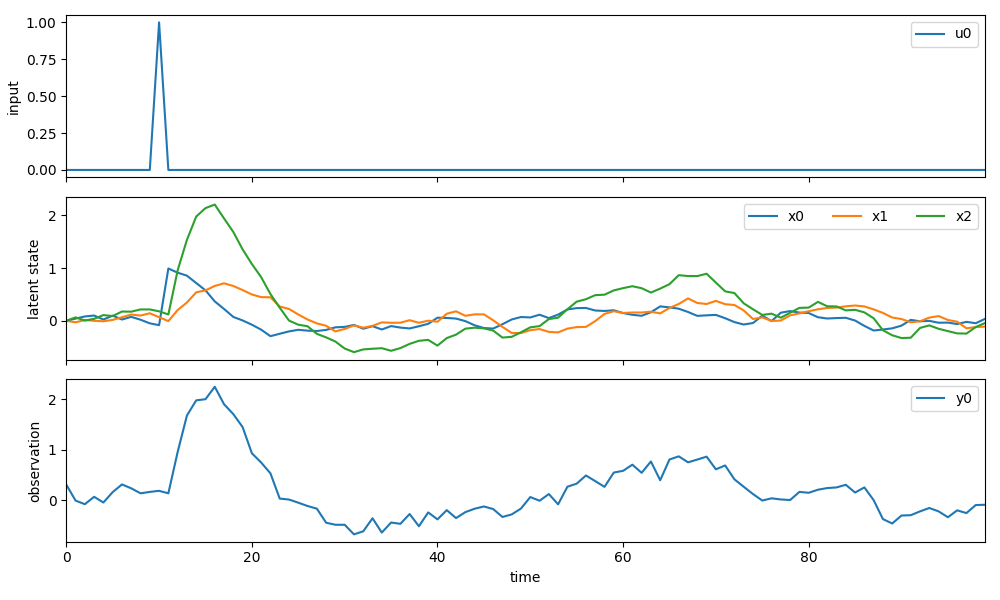

In [29]:
angle = 10 / 180 * np.pi
A = np.array([
    [0.95 * np.cos(angle), -0.95 * np.sin(angle) / 1.5, 0],
    [0.95 * np.sin(angle) * 1.5, 0.90 * np.cos(angle), 0],
    [0.8, 0, 0.8]
])

B = np.array([[1.0], [0.0], [0.0]])

C = np.array([[0.0, 0.0, 1.0]])
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((100, 1))
inputs[10] = 1

x_noise = np.random.normal(0, 0.05, (100, 3))
y_noise = np.random.normal(0, 0.1, (100, 1))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

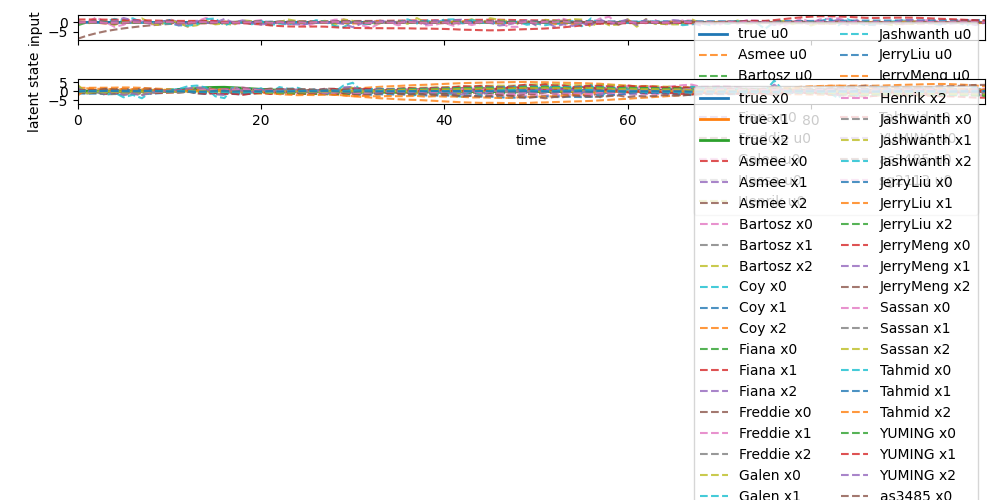

In [30]:
try:
    np.load("MethodResults/SparseImpulseInput_Case13.npz")
except FileNotFoundError:
    subfunc = {key: func for key, func in functions.items() if not key in ["Bartosz", "Fiana", "as3485"]}

    results = run_functions_parallel(
        subfunc,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case13.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 14 - No input noise driven

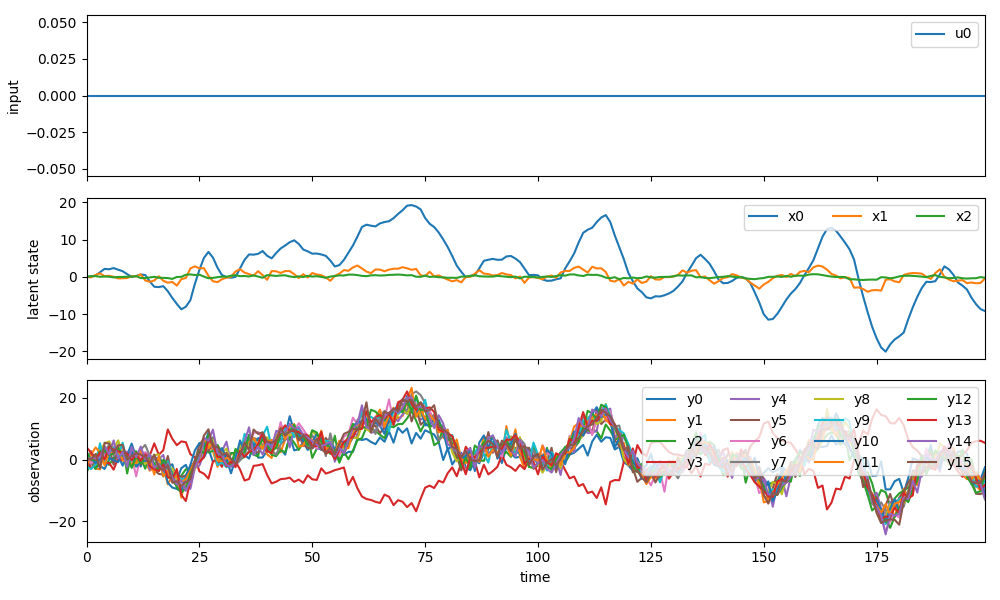

In [31]:
A = np.array([[0.85, 1, 2],
              [0, 0.1, 4],
              [0, 0, 0.8]])

B = np.array([[0], [0], [0.1]])

C = np.random.normal(0, 0.1, (16, 3))
C[:, 0] += np.abs(np.random.normal(0, 0.2, (16,))) + 0.1
C /= np.linalg.norm(C, axis=1, keepdims=True)

inputs = np.zeros((200, 1))

x_noise = np.random.normal(0, 0.2, (200, 3))
y_noise = np.random.normal(0, 2, (200, 16))

states, observations = simulate(A, B, C, inputs, x_noise, y_noise)

plot_input_latent_observation(inputs, states, observations)
plt.show()

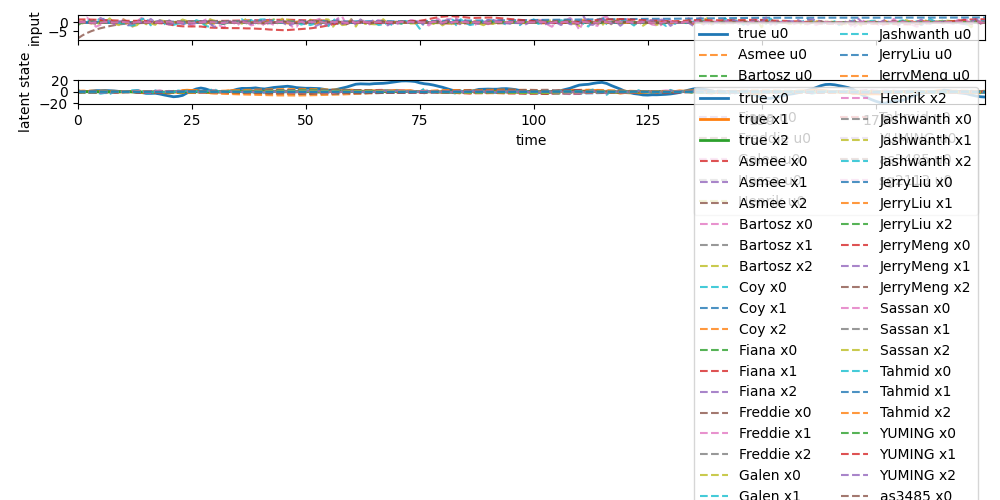

In [32]:
try:
    np.load("MethodResults/SparseImpulseInput_Case14.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/SparseImpulseInput_Case14.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

## Min-energy Input

### Case 1 - null-space injection

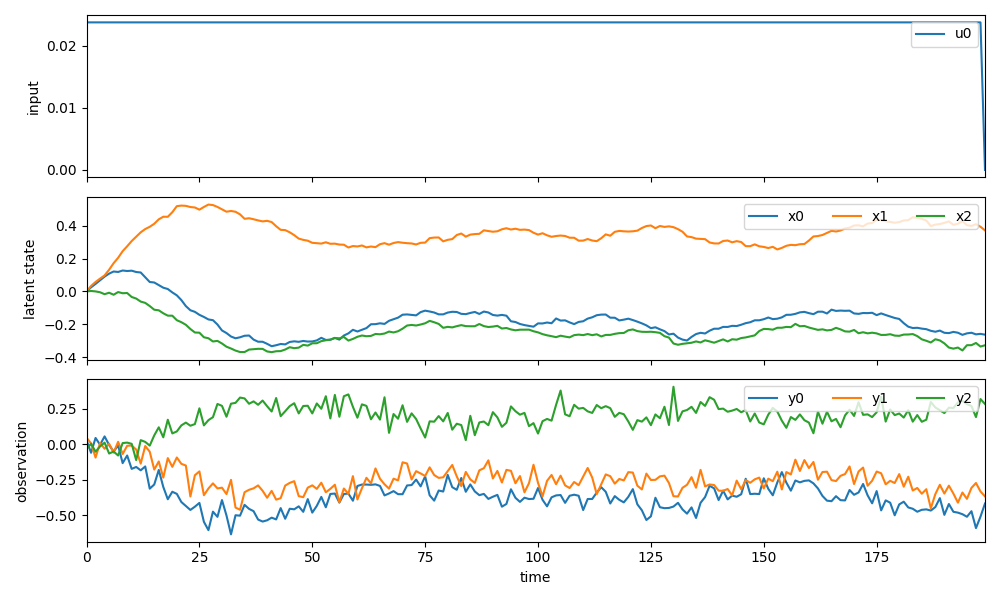

In [33]:
angle = 5 / 180 * np.pi
A = np.array([[np.cos(angle) * 0.98, -np.sin(angle) * 0.98, 0],
              [np.sin(angle) * 0.98, np.cos(angle) * 0.98, 0],
              [0.1, -0.1, 0.8]])

B = np.array([[1], 
              [1], 
              [0]])

C = np.array([[1, -1, 0], 
              [0, 0, 1], 
              [0.1, -0.098, -1]])
C /= np.linalg.norm(C, axis=1, keepdims=True)

x_noise = np.random.normal(0, 0.1, (200, 3))
y_noise = np.random.normal(0, 0.1, (200, 3))

waypoints = {
    (20, 0): 1,
    (25, 1): 1,
    (23, 2): 1,
    (40, 0): 1,
}

x_noise = np.random.normal(0, 0.01, (200, 3))
y_noise = np.random.normal(0, 0.05, (200, 3))

states, observations, inputs, noiseless_states = simulate_from_latents(
    A, B, C,
    latents=waypoints,
    x_noise=x_noise,
    y_noise=y_noise,
    maxu=1.0,
)

plot_input_latent_observation(inputs, states, observations)
plt.show()

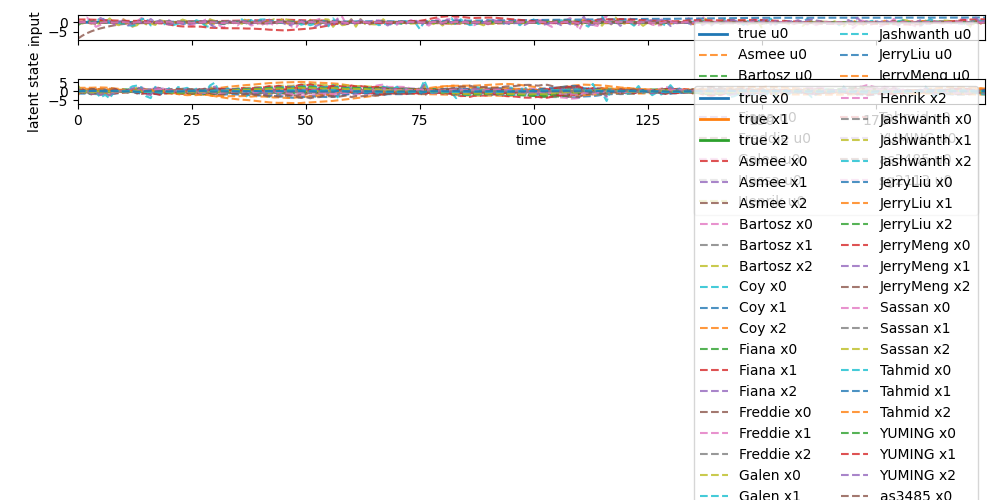

In [34]:
try:
    np.load("MethodResults/MinEnergyInput_Case1.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/MinEnergyInput_Case1.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 2 - null-space injection and hold

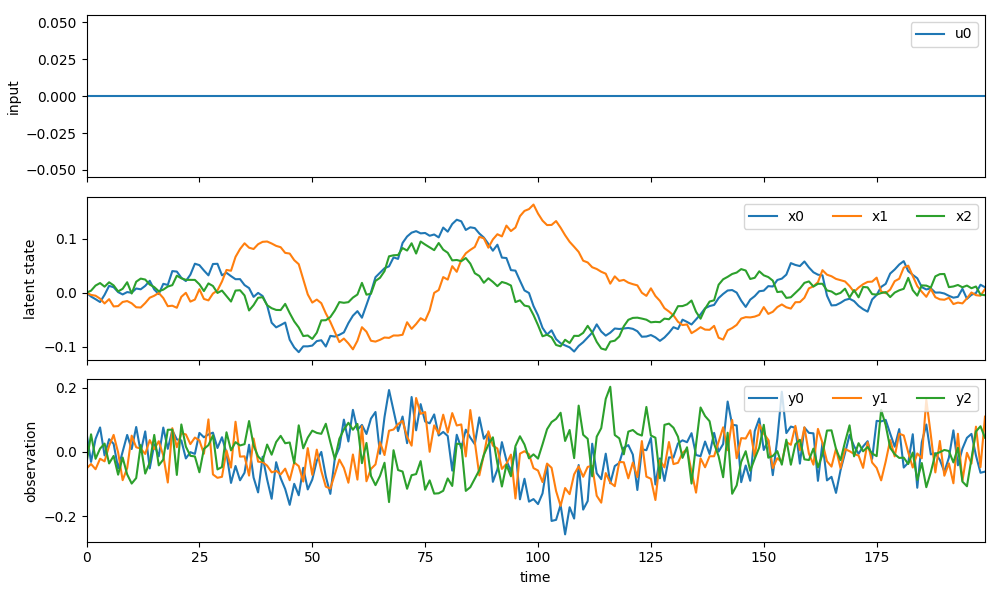

In [35]:
angle = 5 / 180 * np.pi
A = np.array([[np.cos(angle) * 0.98, -np.sin(angle) * 0.98, 0],
              [np.sin(angle) * 0.98, np.cos(angle) * 0.98, 0],
              [0.1, -0.1, 0.8]])

B = np.array([[1], 
              [1], 
              [0]])

C = np.array([[1, -1, 0], 
              [0, 0, 1], 
              [0.1, -0.098, -1]])
C /= np.linalg.norm(C, axis=1, keepdims=True)

x_noise = np.random.normal(0, 0.1, (200, 3))
y_noise = np.random.normal(0, 0.1, (200, 3))


waypoints = {}
for t in range(0, 20):
    waypoints[(t, 0)] = 0
for t in range(40, 60):
    waypoints[(t, 2)] = 1

x_noise = np.random.normal(0, 0.01, (200, 3))
y_noise = np.random.normal(0, 0.05, (200, 3))

states, observations, inputs, noiseless_states = simulate_from_latents(
    A, B, C,
    latents=waypoints,
    x_noise=x_noise,
    y_noise=y_noise,
    maxu=1.0,
)

plot_input_latent_observation(inputs, states, observations)
plt.show()

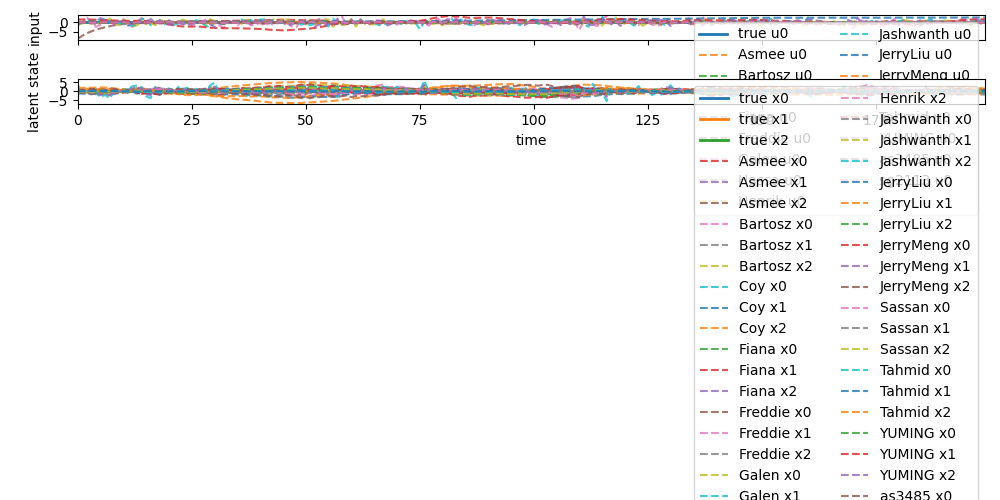

In [36]:
try:
    np.load("MethodResults/MinEnergyInput_Case2.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=3,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/MinEnergyInput_Case2.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 3 - use non-normalty

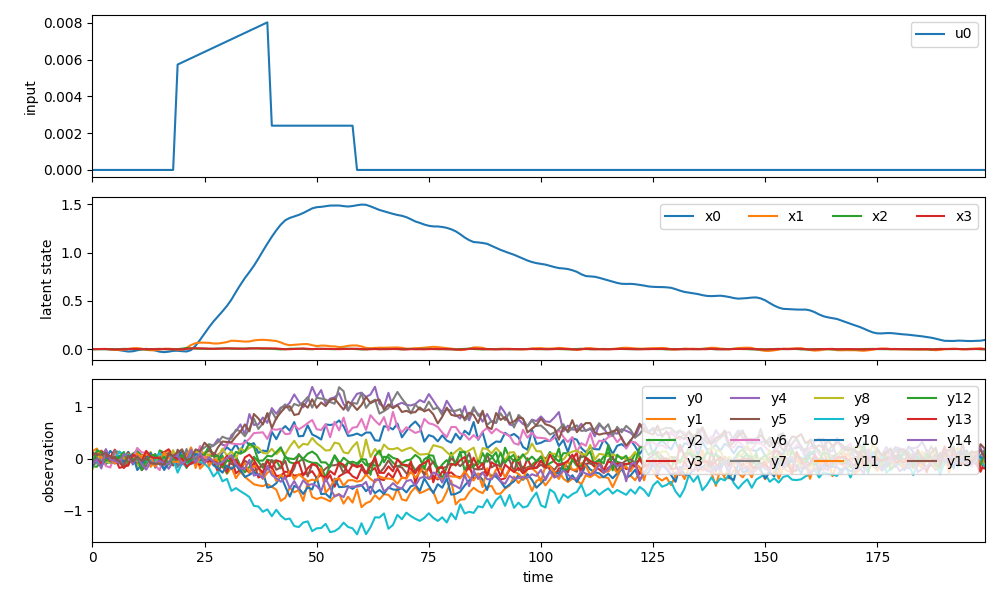

In [37]:
angle = 50 / 180 * np.pi
A = np.array([[0.98, 1, 0, 0],
              [0, 0.8, 3, 0],
              [0, 0, 0.75 * np.cos(angle), -0.75 * np.sin(angle)],
              [0, 0, 0.75 * np.sin(angle), 0.75 * np.cos(angle)],
])

B = np.array([[0.1], [0.1], [0.9], [0]])

C = np.random.normal(0, 1, (16, 4))
C[:, 0] += 0.2
C[:, 1] += 0.1
C /= np.linalg.norm(C, axis=1, keepdims=True)

waypoints = {}
for t in range(0, 20):
    waypoints[(t, 0)] = 0
for t in range(40, 60):
    waypoints[(t, 0)] = 1
for t in range(80, 100):
    waypoints[(t, 0)] = 0

x_noise = np.random.normal(0, 0.001, (200, 4))
y_noise = np.random.normal(0, 0.1, (200, 16))

states, observations, inputs, noiseless_states = simulate_from_latents(
    A, B, C,
    latents=waypoints,
    x_noise=x_noise,
    y_noise=y_noise,
    maxu=1.0,
)

plot_input_latent_observation(inputs, states, observations)
plt.show()

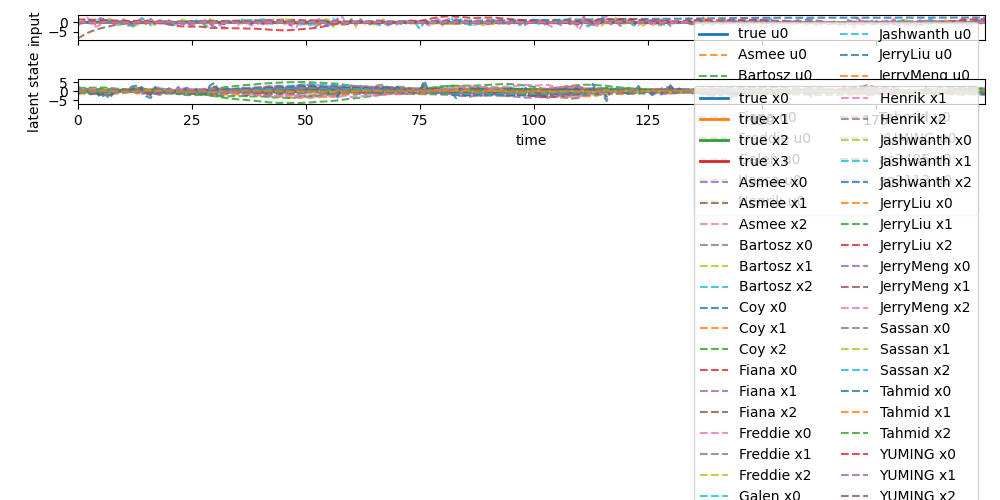

In [38]:
try:
    np.load("MethodResults/MinEnergyInput_Case3.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=4,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/MinEnergyInput_Case3.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

### Case 4 - use non-normalty

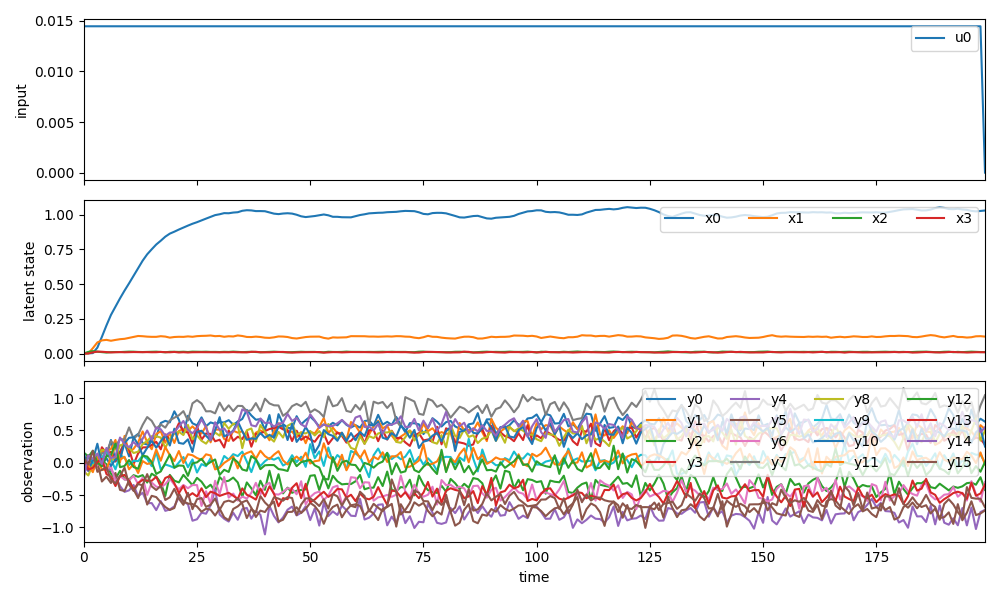

In [39]:
angle = 60 / 180 * np.pi
A = np.array([[0.88, 1, 0, 0],
              [0, 0.7, 3, 0],
              [0, 0, 0.65 * np.cos(angle), -0.65 * np.sin(angle)],
              [0, 0, 0.65 * np.sin(angle), 0.65 * np.cos(angle)],
])

B = np.array([[0.1], [0.1], [0.9], [0]])

C = np.random.normal(0, 1, (16, 4))
C[:, 0] += 0.2
C[:, 1] += 0.1
C /= np.linalg.norm(C, axis=1, keepdims=True)

waypoints = {
    (40, 0): 1,
    (60, 0): 1,
    (80, 0): 1,
}

x_noise = np.random.normal(0, 0.001, (200, 4))
y_noise = np.random.normal(0, 0.1, (200, 16))

states, observations, inputs, noiseless_states = simulate_from_latents(
    A, B, C,
    latents=waypoints,
    x_noise=x_noise,
    y_noise=y_noise,
    maxu=1.0,
)

plot_input_latent_observation(inputs, states, observations)
plt.show()

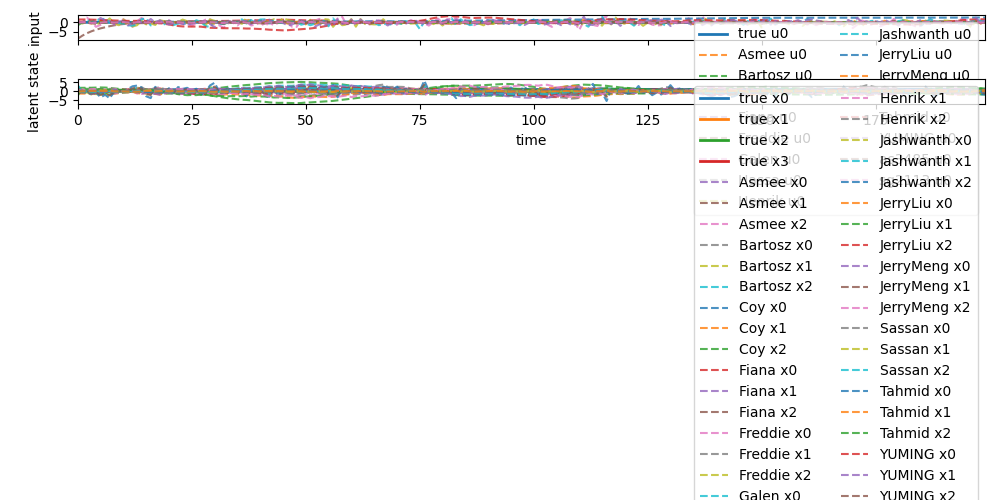

In [40]:
try:
    np.load("MethodResults/MinEnergyInput_Case4.npz")
except FileNotFoundError:
    results = run_functions_parallel(
        functions,
        observations,
        latent_dim=4,
        input_dim=1,
        max_workers="auto",
        native_threads_per_worker=1,
        backend="thread",
        print_shapes=False,
    )
    np.savez("MethodResults/MinEnergyInput_Case4.npz", **results)

plot_input_latent_comparison_interactive(inputs, states, results, align_inputs=False, align_latents=True, active={})
plt.show()

## Hack Now Open